# Chapter-07. 模型创建-玩转模型积木

## 【章节目标】
- 掌握模型搭建的步骤
- 掌握常用网络层的使用
- 掌握封装自定义Module的方法
- 掌握模型容器的使用方法
- 掌握搭建VGG16网络结构

## 【章节内容】
### 7.1 模型搭建步骤
#### 1）回顾机器学习训练步骤

首先回顾一下机器学习模型训练步骤：  
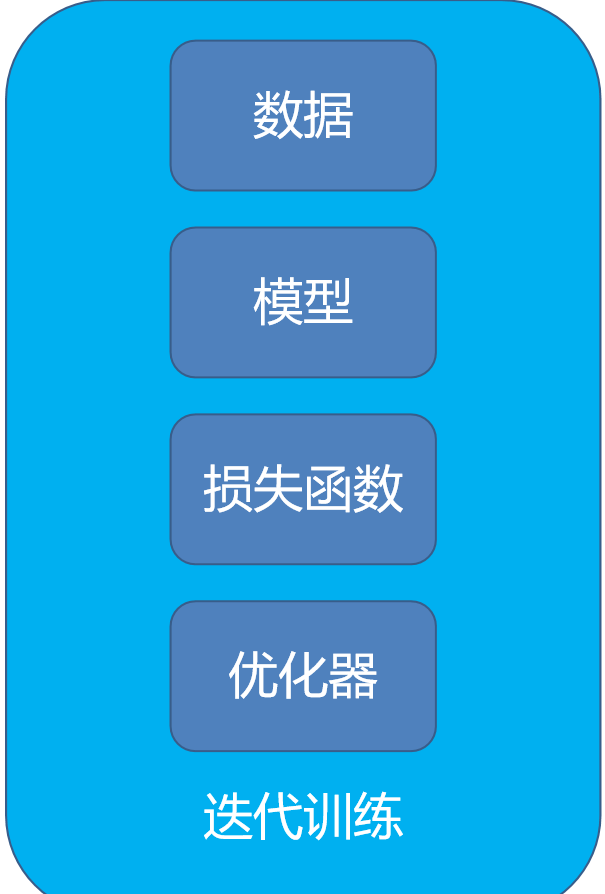

对照代码观察：  
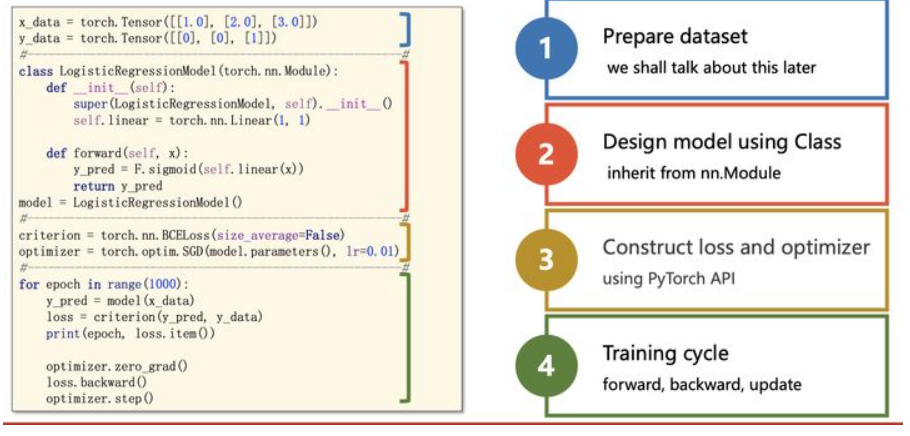

#### 2）torch.nn简介
- torcn.nn是专门为神经网络设计的模块化接口。构建于autograd之上，可以用来定义和运行神经网络。
- torch.nn.Module 是所有神经网络单元的基类，包含网络各层的定义及forward方法。
- pytorch里面一切自定义操作基本上都是继承nn.Module类来实现的。  

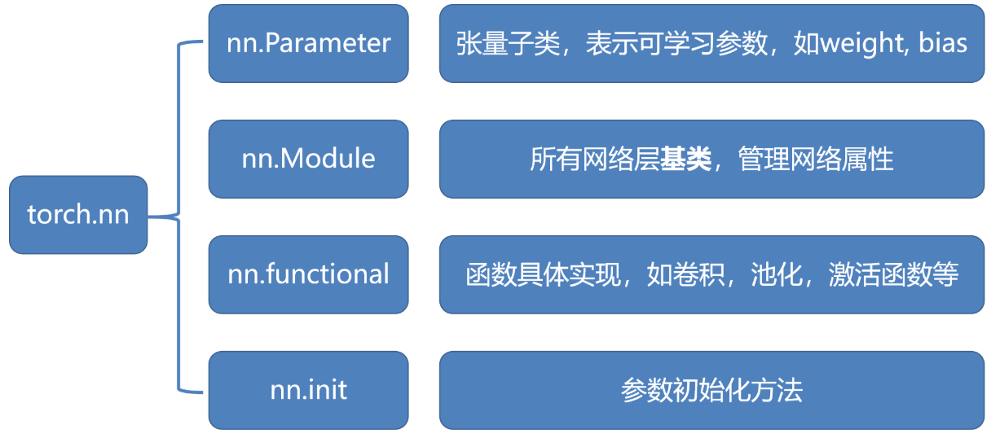

nn.Module  
- 一个module可以包含多个子module
- 一个module相当于一个运算，必须实现forward()函数
- 每个module都有8个字典管理它的属性

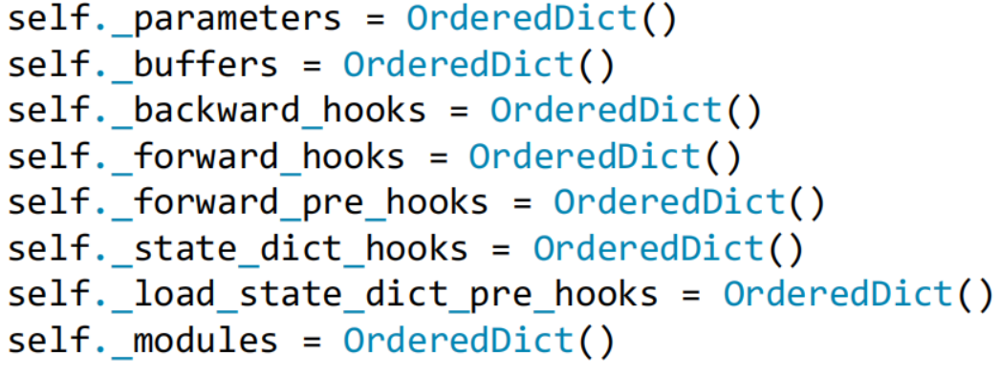

- parameters : 存储管理nn.Parameter类
- modules : 存储管理nn.Module类
- buffers：存储管理缓冲属性，如BN层中的running_mean
- ***_hooks：存储管理钩子函数

**torch.nn中的操作层**

- Linear layers：线性层
    - nn.Linear： 对输入数据进行线性变换

- Convolution layers：卷积层
    - nn.Conv1d：1d卷积 主要用于文本数据
    - nn.Conv2d：2d卷积 主要用于图像数据
    - nn.Conv3d：3d卷积 用于视频、图像序列
    - nn.ConvTranspose1d：1d转置卷积
    - nn.ConvTranspose2d：2d转置卷积
    - nn.ConvTranspose3d：3d转置卷积

- Recurrent layers：循环神经网络层
    - nn.RNNCell/nn.RNN：RNN计算单元/RNN层
    - nn.LSTMCell/nn.LSTM：LSTM计算单元/LSTM层
    - nn.GRUCell/nn.GRU：GRU计算单元/GRU层

- Pooling layers：池化层
    - nn.MaxPool1d：1d最大池化
    - nn.MaxPool2d：2d最大池化
    - nn.AvgPool1d/nn.AvgPool2d：1d平均池化/2d平均池化

- Padding layers：填充层
    - nn.ZeroPad2d：2d零填充

- Non-linear Activations：非线性激活函数
    - nn.Sigmoid
    - nn.Tanh
    - nn.ReLU
    - nn.LeakyReLU
    - nn.PReLU
    - nn.ReLU6
    - nn.SELU
    - nn.ELU
    - nn.GELU
    - nn.Softmax

- Norm layers：归一化层
    - nn.BatchNorm1d
    - nn.BatchNorm2d
    - nn.GroupNorm
    - nn.InstanceNorm2d
    - nn.LayerNorm

- Dropout layers：Dropout层
    - nn.Dropout：1d的dropout 用于全连接层
    - nn.Dropout2d：2d的dropout 用于卷积层

- Sparse layers：嵌入层
    - nn.Embedding：输入onehot向量，返回稠密向量，特征嵌入

- Loss function：损失函数

- Utilities：工具层

#### 3）模型搭建步骤
使用pytorch搭建模型包含以下三个步骤：

- 构建网络基础层（本身也是Module）：卷积层、池化层、激活函数、Dropout层、RNN层等等
- 拼接网络基础层得到模型（Module）：使用搭积木的方法搭建网络（VGG、ResNet等）
- 网络权重初始化：使用各种随机初始化方法初始化w和b（Xavier，Kaiming，均匀分布，正态分布等）

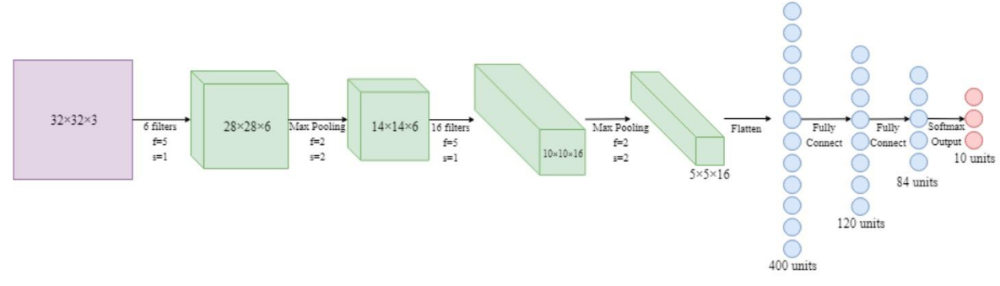

**torch里面实现神经网络有两种方式**
- （1）高层API方法：使用torch.nn.****来实现；
- （2）低层API方法：使用低层函数方法，torch.nn.functional.****来实现；

推荐使用高层API的方法，原因如下：

高层API是使用类的形式来包装的，既然是类就可以存储参数，比如全连接层的权值矩阵、偏置矩阵等都可以作为类的属性存储着，但是低层API仅仅是实现函数的运算功能，没办法保存这些信息，会丢失参数信息，但是高层API是依赖于低层API的计算函数的，比如：

- Linear高级层——>低层F.linear() 函数
- Conv2d高级层——>低层F.conv2d()函数

#### 4）自定义层步骤

- 继承nn.Module：Module是所有模型层的基类
    - 继承nn.Module类之后，在构造函数中要调用Module的构造函数, 例如：super(Linear, self).init()。
- 重写__init__方法：在__init__构造函数中申明各个层的定义
    - 一般把网络中具有可学习参数的层放在构造函数__init__()中。
    - 通过nn.Parameter()使参数以parameters（一种tensor,默认是自动求导）的形式存在Module中，并且通过parameters()或者named_parameters()以迭代器的方式返回可学习参数。
- 重写forward方法：forward中实现层之间的连接关系，实际上就是前向传播的过程
    - 不具有可学习参数的层（如ReLU）可放在构造函数中，也可不放在构造函数中（而在forward中使用nn.functional来代替）。
    - 只要在nn.Module中定义了forward函数，backward函数就会被自动实现（利用Autograd)。而且一般不是显式的调用forward(layer.forward), 而是layer(input), 会自执行forward()。
    - 在forward中可以使用任何Variable支持的函数，毕竟在整个pytorch构建的图中，是Varible在流动。还可以使用if, for, print, log等python语法。

**搭建Lenet代码：**

In [2]:
from torch import nn
import torch.nn.functional as F

class LeNet(nn.Module):
    def __init__(self):
        super(LeNet, self).__init__() # 调用父类的init方法
        self.conv1 = nn.Conv2d(3, 6, 5)
        self.pool1 = nn.MaxPool2d(2, 2)
        self.conv2 = nn.Conv2d(6, 16, 5)
        self.pool2 = nn.MaxPool2d(2, 2)
        self.fc1 = nn.Linear(16 * 5 * 5, 120)
        self.fc2 = nn.Linear(120, 84)
        self.fc3 = nn.Linear(84, 10)

    def forward(self, x):
        x = self.pool1(F.relu(self.conv1(x))) # 这里relu也可以定义在init
        x = self.pool2(F.relu(self.conv2(x)))
        x = x.view(-1, 16 * 5 * 5)
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x) # 输出层不需要激活了
        return x

### 7.2 常用层使用介绍
#### 1）Linear layers：线性层

Linear(in_features, out_features, bias=True)

- 功能：实现线性映射(y = xAT + b)
- 参数：
    - in_features：输入样本的shape
    - out_features：输出样本的shape
    - bias：是否使用参数b

In [4]:
import torch
m = nn.Linear(20, 30)
input = torch.randn(128, 20) #128为批次（样本个数） 20是每个样本的特征数
output = m(input)
print(output.size())

torch.Size([128, 30])


#### 2）Convolution layers：卷积层

##### 2.1 Conv2d(in_channels, out_channels, kernel_size, stride=1, padding=0, dilation=1, groups=1, bias=True, padding_mode='zeros')

- 功能实现2d卷积(（downsample:大特征图-->小特征图）)
- 参数
    - in_channels:输入通道数
    - out_channels：输出通道数
    - kernel_size：卷积核尺寸，整数或者元组
    - stride：卷积操作的步幅，整数或者元组
    - padding：数据hw方向上填充的层数，整数或者元组，默认填充的是0
    - dilation：卷积核内部各点的间距，整数或者元组，用来实现空洞卷积（膨胀卷积）
    - bias：bool类型，为true的话就会对输出添加可学习的偏置量
    - padding_mode：填充模式，字符串类型，可选值 'zeros', 'reflect', 'replicate' or 'circular'

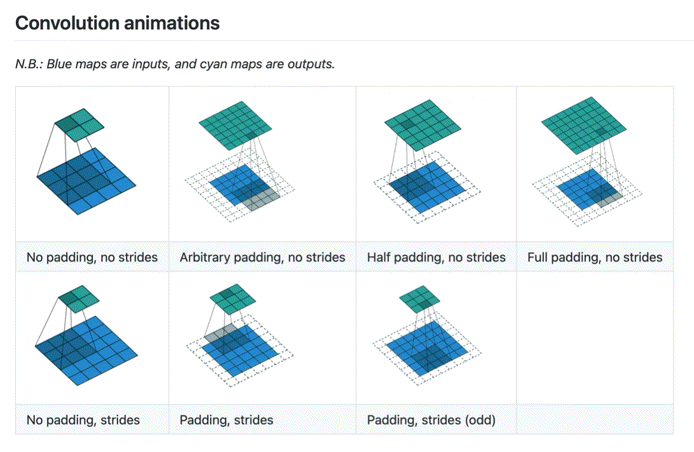

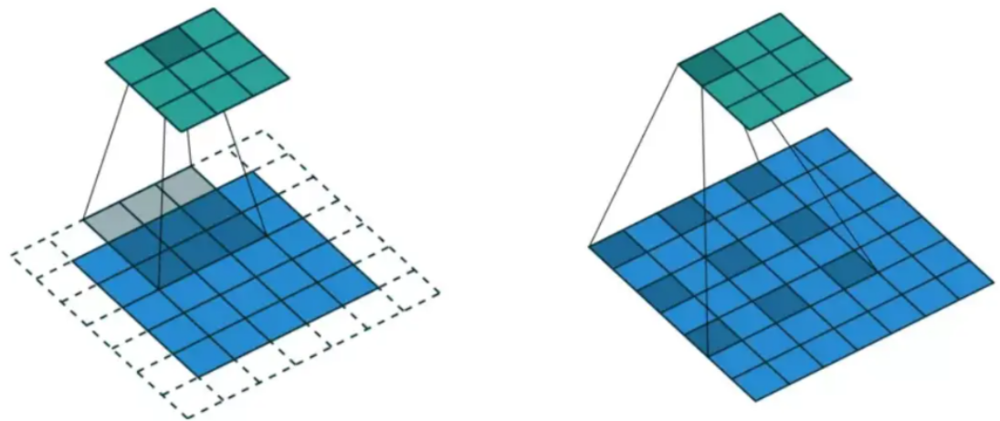

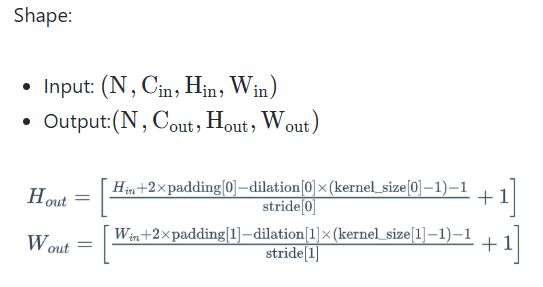

In [9]:
# 示例
# With square kernels and equal stride
#m = nn.Conv2d(16, 33, 3, stride = 2) # torch.Size([20, 33, 24, 49])
# non-square kernels and unequal stride and with padding
# m = nn.Conv2d(16, 33, (3, 5), stride = (2, 1), padding = (4, 2)) # torch.Size([20, 33, 28, 100])
# non-square kernels and unequal stride and with padding and dilation
m = nn.Conv2d(16, 33, (3, 5), stride = (2, 1), padding = (4, 2), dilation = (3, 1))
input = torch.randn(20, 16, 50, 100) # 参数顺序 n c h w
output = m(input)
print(output.size()) 

torch.Size([20, 33, 26, 100])


##### 2.2 ConvTranspose2d(in_channels, out_channels, kernel_size, stride=1, padding=0, output_padding=0, groups=1, bias=True, dilation=1, padding_mode='zeros', device=None, dtype=None)

- 功能实现2d转置卷积（upsample:小特征图-->大特征图）

- 参数：基本跟Conv2d相同
    - output_padding: 对输出的hw填充的层数，整数或者元组

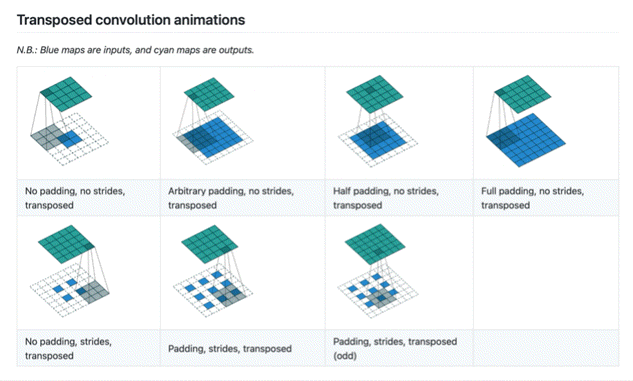

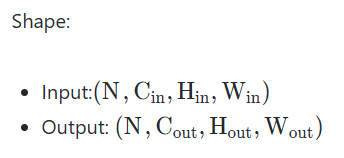

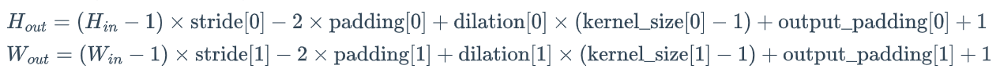

In [10]:
# With square kernels and equal stride
# m = nn.ConvTranspose2d(16, 33, 3, stride=2)
# non-square kernels and unequal stride and with padding
m = nn.ConvTranspose2d(16, 33, (3, 5), stride=(2, 1), padding=(4, 2))
input = torch.randn(20, 16, 50, 100)
output = m(input)
output.size()

torch.Size([20, 33, 93, 100])

In [11]:
# exact output size can be also specified as an argument
input = torch.randn(1, 16, 12, 12)
downsample = nn.Conv2d(16, 16, 3, stride = 2, padding = 1)
upsample = nn.ConvTranspose2d(16, 16, 3, stride = 2, padding = 1)
h = downsample(input)
h.size()
# torch.Size([1, 16, 6, 6])
output = upsample(h, output_size = input.size())
output.size()

torch.Size([1, 16, 12, 12])

#### 3）Recurrent layers：循环神经网络层
##### 3.1 nn.LSTMCell(input_size, hidden_size, bias=True, device=None, dtype=None)

- 功能：实现LSTM单元计算
- 参数：
    - input_size：输入数据x的向量长度
    - hidden_size：LSTM状态向量（h和c）的长度
    - bias：是否使用b

    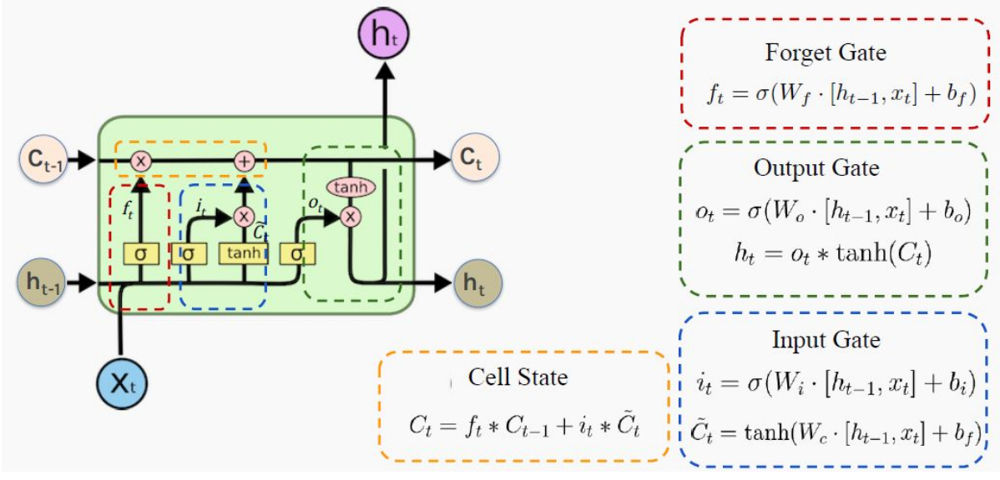

In [13]:
rnn = nn.LSTMCell(4, 6) # (input_size, hidden_size)
input = torch.randn(2, 3, 4) # (time_steps, batch, input_size)
hx = torch.randn(3, 6) # 初始化状态h(batch, hidden_size)
cx = torch.randn(3, 6) # 初始化状态c
output = []
for i in range(input.size()[0]):
    hx, cx = rnn(input[i], (hx, cx))
    output.append(hx)
output = torch.stack(output, dim = 0)
output.shape

torch.Size([2, 3, 6])

nn.LSTM实际上实现了上述过程，但是LSTMCell可以让我们自定义这个类的实现过程

##### 3.2 **nn.LSTM(*args, kwargs)

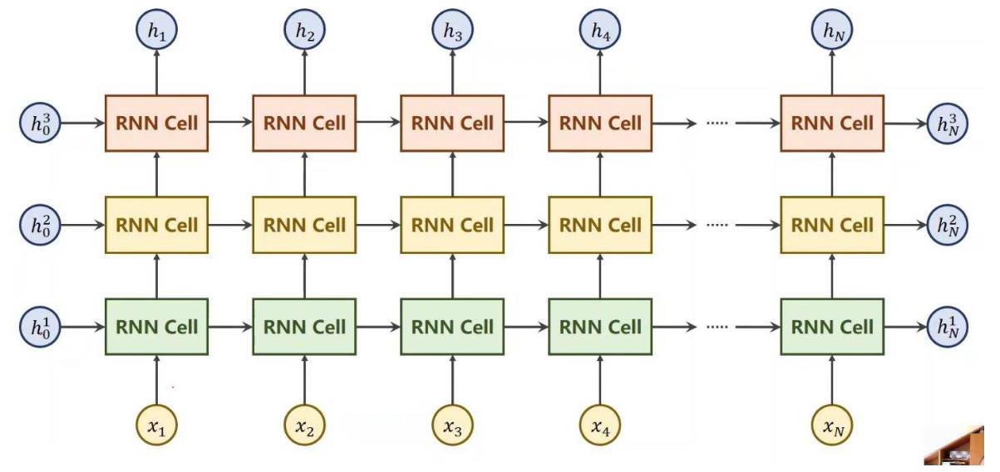

LSTM自动实现了前向传播，不需要自己对序列进行迭代。创建需要指定如下参数，并至少指定前三个参数。
- input_size:输入特征维数
- hidden_size:隐层状态的维数
- num_layers:RNN层的个数，在图中竖向的是层数，横向的是seq_len
- bias:隐层状态是否带bias，默认为true
- batch_first:是否输入输出的第一维为batch_size，因为pytorch中batch_size维度默认是第二维度，故此选项可以将batch_size放在第一维度。如input是(4,1,5)，中间的1是batch_size，指定batch_first=True后就是(1,4,5)
- dropout:是否在除最后一个RNN层外的RNN层后面加dropout层
- bidirectional:是否是双向RNN，默认为false，若为true，则num_directions=2，否则为1

In [15]:
rnn = nn.LSTM(4, 6, 1) # (input_size, hidden_size, num_layers)
input = torch.randn(2, 3, 4) # (time_steps, batch, input_size)
h0 = torch.randn(1, 3, 6) # 初始化状态h(num_layers, batch, hidden_size)
c0 = torch.randn(1, 3, 6)# 初始化状态c
output, (hn, cn) = rnn(input, (h0, c0)) # 不需要循环  output是每个时刻的h    (hn, cn) 最后一个时刻的h和c
output, output.shape

(tensor([[[ 0.1737, -0.1230,  0.0373,  0.5268, -0.1974, -0.0448],
          [ 0.2867,  0.0402,  0.1479,  0.3351, -0.0069,  0.2892],
          [-0.3243, -0.3970,  0.2005,  0.3721,  0.0017, -0.3193]],
 
         [[ 0.0623, -0.1689,  0.2801,  0.4755, -0.1107,  0.0233],
          [-0.0097, -0.1094,  0.2160,  0.1253,  0.0573,  0.0759],
          [-0.0823, -0.2408, -0.0446,  0.1153,  0.1892, -0.1932]]],
        grad_fn=<MkldnnRnnLayerBackward0>),
 torch.Size([2, 3, 6]))

#### 3）Pooling layers：池化层
nn.MaxPool2d(kernel_size, stride=None, padding=0, dilation=1, return_indices=False, ceil_mode=False)

- 功能：实现2d最大池化
- 参数：
    - kernel_size:窗口尺寸；整数或者元组
    - stride：窗口的步幅，默认就等于窗口尺寸；整数或者元组
    - padding：数据hw方向上的零填充层数；整数或者元组

    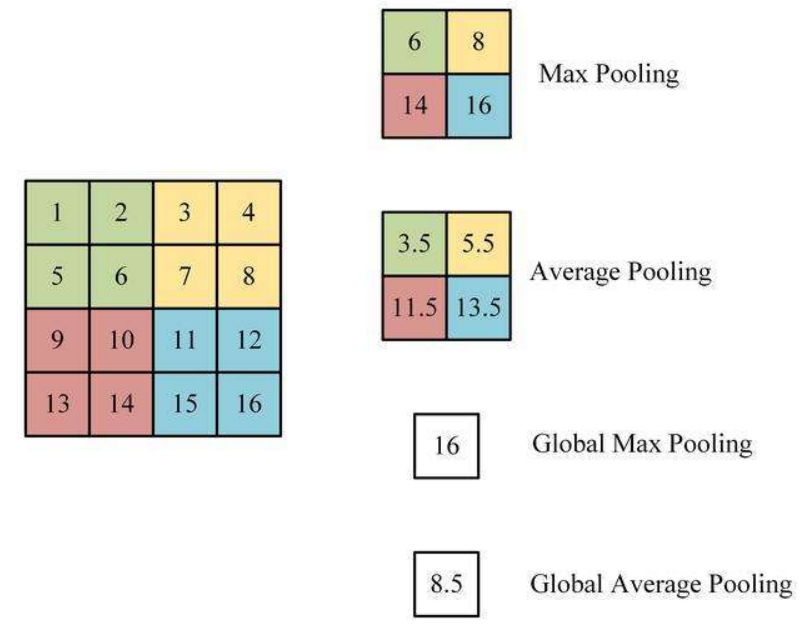

In [16]:
# pool of square window of size = 3, stride = 2
m = nn.MaxPool2d(3, stride = 2)
# pool of non-square window
m = nn.MaxPool2d((3, 2), stride = (2, 1))
input = torch.randn(20, 16, 8, 6)
output = m(input)
output.size()

torch.Size([20, 16, 3, 5])

#### 4）零填充：ZeroPad2d

nn.ZeroPad2d(padding)

- 功能：用零填充输入张量的边界
- 参数：
    - padding:填充的层数，整数或者元组；
        - 如果是一个整数值n，那么在四个边界上都填充n层0；
        - 如果是四个整数值组成的元组，那么就分别表示对应方向上填充0的层数

In [17]:
m = nn.ZeroPad2d(2)
input = torch.randn(1, 1, 3, 3)
input

tensor([[[[-0.5012,  1.5351, -0.1825],
          [ 1.7468,  1.9746,  0.0057],
          [ 0.7360, -0.9622, -1.3303]]]])

In [18]:
m(input)

tensor([[[[ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000, -0.5012,  1.5351, -0.1825,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  1.7468,  1.9746,  0.0057,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.7360, -0.9622, -1.3303,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000]]]])

#### 5）非线性激活层

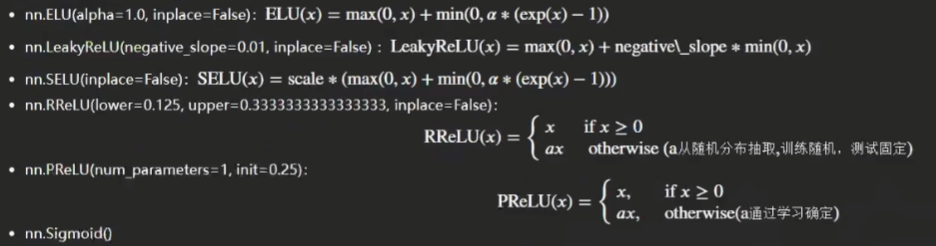

In [19]:
input = torch.tensor([-1., 0., 1.])
m = [nn.ELU(), nn.LeakyReLU(), nn.SELU(), nn.RReLU(), nn.PReLU(), nn.Sigmoid(), nn.ReLU()] #注意 Prelu是需要学习的，所以必须放到init方法中定义
[f(input) for f in m]

[tensor([-0.6321,  0.0000,  1.0000]),
 tensor([-0.0100,  0.0000,  1.0000]),
 tensor([-1.1113,  0.0000,  1.0507]),
 tensor([-0.2491,  0.0000,  1.0000]),
 tensor([-0.2500,  0.0000,  1.0000], grad_fn=<PreluKernelBackward0>),
 tensor([0.2689, 0.5000, 0.7311]),
 tensor([0., 0., 1.])]

#### 6）BatchNorm2d 标准化层  
nn.BatchNorm2d(num_features, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)  
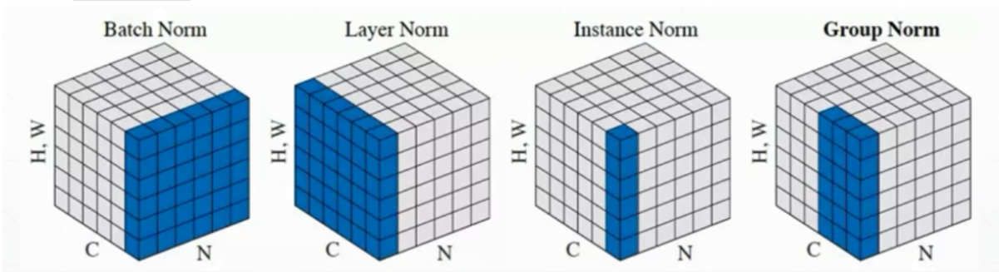  
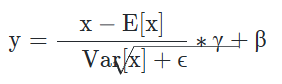  
(γ和β是要学习的参数)
- 功能：实现Batch Normalization
- 参数：
    - num_features:来自期望输入的通道数
    - eps:为保证数值稳定性（分母不能趋近或取0）,给分母加上的值。默认为1e-5
    - momentum:动态均值和动态方差所使用的动量,默认为0.1

In [20]:
m = nn.BatchNorm2d(5)
input = torch.randn(1, 5, 3, 3) # n c h w
input

tensor([[[[-0.8886, -0.8913, -0.3363],
          [ 1.3941,  1.2342,  1.7115],
          [-1.1959, -0.1119, -0.5907]],

         [[ 0.1387, -0.0428, -0.1989],
          [-0.5957,  1.5124, -0.7731],
          [ 0.0908,  0.9819, -0.8977]],

         [[ 2.1746, -0.0502,  1.9403],
          [ 0.1918, -0.7163,  1.1402],
          [ 0.6736, -0.4057,  1.8345]],

         [[-0.9575, -1.4157, -1.3826],
          [-1.3911,  1.8267, -0.5610],
          [ 0.2629, -0.4780, -2.0195]],

         [[-0.6376,  0.1489,  1.1421],
          [-0.1596,  0.2967,  0.3856],
          [-0.1638,  2.7328, -0.4999]]]])

In [22]:
output = m(input)
output, list(m.parameters())

(tensor([[[[-0.8829, -0.8855, -0.3556],
           [ 1.2965,  1.1439,  1.5996],
           [-1.1763, -0.1413, -0.5985]],
 
          [[ 0.1528, -0.0890, -0.2968],
           [-0.8253,  1.9824, -1.0615],
           [ 0.0890,  1.2759, -1.2275]],
 
          [[ 1.4040, -0.7943,  1.1725],
           [-0.5551, -1.4525,  0.3820],
           [-0.0791, -1.1456,  1.0680]],
 
          [[-0.2557, -0.6771, -0.6467],
           [-0.6544,  2.3051,  0.1091],
           [ 0.8667,  0.1853, -1.2324]],
 
          [[-1.0229, -0.2170,  0.8009],
           [-0.5331, -0.0655,  0.0256],
           [-0.5373,  2.4310, -0.8818]]]], grad_fn=<NativeBatchNormBackward0>),
 [Parameter containing:
  tensor([1., 1., 1., 1., 1.], requires_grad=True),
  Parameter containing:
  tensor([0., 0., 0., 0., 0.], requires_grad=True)])

#### 7）Dropout

nn.Dropout(p=0.5, inplace=False)

- p：将元素置0的概率，默认值=0.5

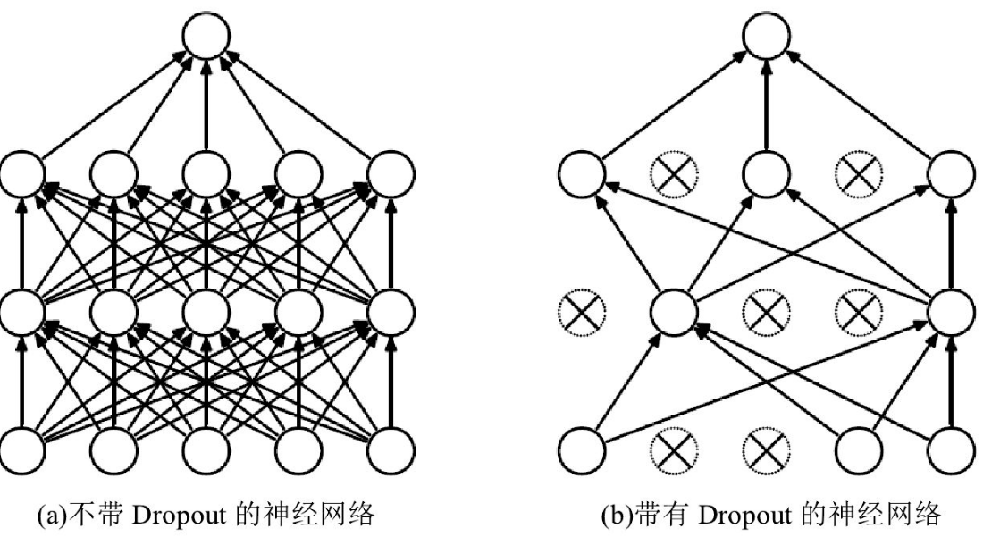

In [23]:
m = nn.Dropout(p = 0.8)
input = torch.randn(2, 10)
m(input)

tensor([[-0.0000, 13.8957,  0.0000,  8.3632, -0.0000, -0.0000,  0.0000, -0.0000,
          0.0000,  0.0000],
        [ 0.0000, -0.0000, -0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          3.8727,  1.0895]])

### 7.3 模型搭建
#### 1）搭建VGG16模型
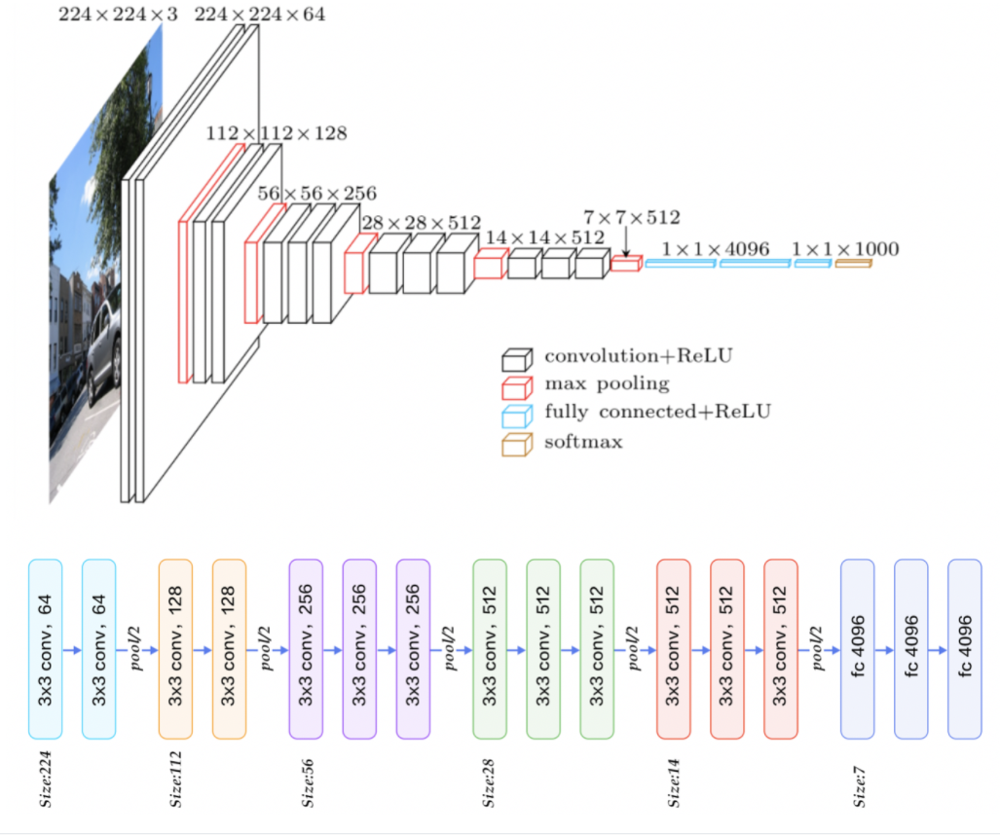

In [27]:
from torch import nn
import torch.nn.functional as F

class VGGNet(nn.Module):
    def __init__(self, num_classes):
        super(VGGNet, self).__init__()
        self.num_classes = num_classes # 分类类别数
        # block1
        self.conv1_1 = nn.Conv2d(in_channels = 3, out_channels = 64, padding = 1, kernel_size = 3, stride = 1)
        self.conv1_2 = nn.Conv2d(in_channels = 64, out_channels = 64, padding = 1, kernel_size = 3, stride = 1)
        self.pool1 = nn.MaxPool2d(kernel_size = 2, stride = 2) # 224 - 112
        # block2
        self.conv2_1 = nn.Conv2d(in_channels = 64, out_channels = 128, padding = 1, kernel_size = 3, stride = 1)
        self.conv2_2 = nn.Conv2d(in_channels = 128, out_channels = 128, padding = 1, kernel_size = 3, stride = 1)
        self.pool2 = nn.MaxPool2d(kernel_size = 2, stride = 2) # 112 - 56
        # block3
        self.conv3_1 = nn.Conv2d(in_channels = 128, out_channels = 256, padding = 1, kernel_size = 3, stride = 1)
        self.conv3_2 = nn.Conv2d(in_channels = 256, out_channels = 256, padding = 1, kernel_size = 3, stride = 1)
        self.conv3_3 = nn.Conv2d(in_channels = 256, out_channels = 256, padding = 1, kernel_size = 3, stride = 1)
        self.pool3 = nn.MaxPool2d(kernel_size = 2, stride = 2) # 56 - 28
        # block4
        self.conv4_1 = nn.Conv2d(in_channels = 256, out_channels = 512, padding = 1, kernel_size = 3, stride = 1)
        self.conv4_2 = nn.Conv2d(in_channels = 512, out_channels = 512, padding = 1, kernel_size = 3, stride = 1)
        self.conv4_3 = nn.Conv2d(in_channels = 512, out_channels = 512, padding = 1, kernel_size = 3, stride = 1)
        self.pool4 = nn.MaxPool2d(kernel_size = 2, stride = 2) # 28 - 14
        # block5
        self.conv5_1 = nn.Conv2d(in_channels = 512, out_channels = 512, padding = 1, kernel_size = 3, stride = 1)
        self.conv5_2 = nn.Conv2d(in_channels = 512, out_channels = 512, padding = 1, kernel_size = 3, stride = 1)
        self.conv5_3 = nn.Conv2d(in_channels = 512, out_channels = 512, padding = 1, kernel_size = 3, stride = 1)
        self.pool5 = nn.MaxPool2d(kernel_size = 2, stride = 2) # 14 - 7
        # classifier
        self.fc1 = nn.Linear(in_features = 512 * 7 * 7, out_features = 4096)
        self.drop1 = nn.Dropout(p = 0.5)
        self.fc2 = nn.Linear(in_features = 4096, out_features = 4096)
        self.drop2 = nn.Dropout(p = 0.5)
        self.fc3 = nn.Linear(in_features = 4096, out_features = num_classes)

    def forward(self, x):
        # block1
        x = F.relu(self.conv1_1(x))
        x = self.pool1(F.relu(self.conv1_2(x)))
        # block2
        x = F.relu(self.conv2_1(x))
        x = self.pool2(F.relu(self.conv2_2(x)))
        # block3
        x = F.relu(self.conv3_1(x))
        x = F.relu(self.conv3_2(x))
        x = self.pool3(F.relu(self.conv3_3(x)))
        # block4
        x = F.relu(self.conv4_1(x))
        x = F.relu(self.conv4_2(x))
        x = self.pool4(F.relu(self.conv4_3(x)))
        # block5
        x = F.relu(self.conv5_1(x))
        x = F.relu(self.conv5_2(x))
        x = self.pool5(F.relu(self.conv5_3(x)))

        x = x.view(x.size(0), -1) # 拉平 x.size(0)就是n(batch_Size), -1表示chw也就是num_features

        # classifier
        x = self.drop1(F.relu(self.fc1(x)))
        x = self.drop2(F.relu(self.fc2(x)))
        x = self.fc3(x)
        return x

m = VGGNet(10)
input = torch.randn(8, 3, 224, 224)
output = m(input)
output.size()

torch.Size([8, 10])

是不是感觉代码重复太多？有没有更好的方法？

#### 2）定义子Module

将重复部分的代码定义为子Module，然后调用  
**注意：下方法是用python原生的字典容器实现，前向传播没问题，反向传播过程中由于参数没有注册导致不能求导，因此正式建模要使用pytorch的模型容器去存储**

In [31]:
from collections import OrderedDict
class VGGBlock(nn.Module):
    def __init__(self, channels, kernel_size, padding, stride, activate = nn.ReLU()):
        '''
        channels:列表或元组，每层的输入通道数和输出通道数 [3,64,64]
        '''
        super(VGGBlock, self).__init__()
        self.layers = OrderedDict() # 有序字典
        for i in range(len(channels) - 1):
            self.layers['conv' + str(i+1)] = nn.Conv2d(
                in_channels = channels[i],
                out_channels = channels[i+1],
                padding = padding,
                kernel_size = kernel_size,
                stride = stride
            )
            self.layers['activate' + str(i+1)] = activate
        self.layers['maxpool'] = nn.MaxPool2d(kernel_size = 2, stride = 2)
    
    def forward(self, x):
        for k, layer in self.layers.items():
            x = layer(x)
        return x

class VGGNet(nn.Module):
    def __init__(self, num_classes):
        super(VGGNet, self).__init__()
        self.num_classes = num_classes
        # block1
        self.block1 = VGGBlock([3, 64, 64], padding = 1, kernel_size = 3, stride = 1)
        #block2
        self.block2=VGGBlock([64,128,128],padding=1, kernel_size=3, stride=1)
        #block3
        self.block3=VGGBlock([128,256,256,256],padding=1, kernel_size=3, stride=1)
        #block4
        self.block4=VGGBlock([256,512,512,512],padding=1, kernel_size=3, stride=1)
        #block5
        self.block5=VGGBlock([512,512,512,512],padding=1, kernel_size=3, stride=1)

        #classifier
        self.fc1=nn.Linear(in_features=512*7*7, out_features=4096)
        self.drop1=nn.Dropout(p=0.5)
        self.fc2=nn.Linear(in_features=4096, out_features=4096)
        self.drop2=nn.Dropout(p=0.5)
        self.fc3=nn.Linear(in_features=4096, out_features=self.num_classes)

    def forward(self, x):
        x = self.block1(x)
        x=self.block2(x)
        x=self.block3(x)
        x=self.block4(x)
        x=self.block5(x)

        x = x.view(x.size(0), -1)

        #classifier
        x = self.drop1(F.relu(self.fc1(x)))
        x = self.drop2(F.relu(self.fc2(x)))
        x = self.fc3(x)
        return x
    
m = VGGNet(10)
input = torch.randn(8, 3, 224, 224)
output = m(input)
output.size()

torch.Size([8, 10])

### 7.4 模型容器
#### 1）模型容器简介
**模型容器理解**  
刚刚创建的VGGNEet还能再简单点吗？  
能，用列表把每个层装起来看可不可以？

In [32]:
class VGGNet(nn.Module):
    def __init__(self,num_classes):
        super(VGGNet, self).__init__()
        self.num_classes = num_classes
        self.feature=[]
        #block1
        self.feature.append(VGGBlock([3,64,64],padding=1, kernel_size=3, stride=1))
        #block2
        self.feature.append(VGGBlock([64,128,128],padding=1, kernel_size=3, stride=1))
        #block3
        self.feature.append(VGGBlock([128,256,256,256],padding=1, kernel_size=3, stride=1))
        #block4
        self.feature.append(VGGBlock([256,512,512,512],padding=1, kernel_size=3, stride=1))
        #block5
        self.feature.append(VGGBlock([512,512,512,512],padding=1, kernel_size=3, stride=1))
        
        
        #classifier
        self.classifier=[]
        self.classifier.append(nn.Linear(in_features=512*7*7, out_features=4096))
        self.classifier.append(nn.ReLU())
        self.classifier.append(nn.Dropout(p=0.5))
        self.classifier.append(nn.Linear(in_features=4096, out_features=4096))
        self.classifier.append(nn.ReLU())       
        self.classifier.append(nn.Dropout(p=0.5))
        self.classifier.append(nn.Linear(in_features=4096, out_features=self.num_classes))
        
    def forward(self, x):
        for layer in self.feature:
            x=layer(x)
        
        x = x.view(x.size(0), -1)
        
        for layer in self.classifier:
            x=layer(x)
        return x
    
m = VGGNet(10)
input = torch.randn(8, 3, 224, 224)
output = m(input)
output.size()

torch.Size([8, 10])

通过使用列表我们可以极大的简化forward方法的实现。但是还是要用for循环遍历，这个循环能不能也省掉呢？

定义一个类继承列表和Module，在forwaord方法中将循环遍历掉，然后调用这个类

In [33]:
from typing import List
class ModuleList(nn.Module,List): #并没有将加入的层的参数注册  将来反向传播求导就会出现问题
    def __init__(self):
        super(ModuleList, self).__init__()
    def forward(self,x):
        for layer in self:
            x=layer(x)
        return x

class VGGNet(nn.Module):
    def __init__(self,num_classes):
        super(VGGNet, self).__init__()
        self.num_classes = num_classes
        self.feature=ModuleList()
        #block1
        self.feature.append(VGGBlock([3,64,64],padding=1, kernel_size=3, stride=1))
        #block2
        self.feature.append(VGGBlock([64,128,128],padding=1, kernel_size=3, stride=1))
        #block3
        self.feature.append(VGGBlock([128,256,256,256],padding=1, kernel_size=3, stride=1))
        #block4
        self.feature.append(VGGBlock([256,512,512,512],padding=1, kernel_size=3, stride=1))
        #block5
        self.feature.append(VGGBlock([512,512,512,512],padding=1, kernel_size=3, stride=1))
        
        
        #classifier
        self.classifier=ModuleList()
        self.classifier.append(nn.Linear(in_features=512*7*7, out_features=4096))
        self.classifier.append(nn.ReLU())
        self.classifier.append(nn.Dropout(p=0.5))
        self.classifier.append(nn.Linear(in_features=4096, out_features=4096))
        self.classifier.append(nn.ReLU())       
        self.classifier.append(nn.Dropout(p=0.5))
        self.classifier.append(nn.Linear(in_features=4096, out_features=self.num_classes))
        
    def forward(self, x):
        x=self.feature(x)
        
        x = x.view(x.size(0), -1)
        
        x=self.classifier(x)
        return x
    
m = VGGNet(10)
input = torch.randn(8, 3, 224, 224)
output = m(input)
output.size(),m,m.parameters

(torch.Size([8, 10]),
 VGGNet(
   (feature): ModuleList()
   (classifier): ModuleList()
 ),
 <bound method Module.parameters of VGGNet(
   (feature): ModuleList()
   (classifier): ModuleList()
 )>)

**pytorch提供的模型容器**
- nn.Sequetial：按顺序包装多个网络层
- nn.ModuleList：像python的list一样包装多个网络层
- nn.ModuleDict：像python的dict一样包装多个网络层

**注意：都继承了 nn.Module这个基类，都实现了参数的注册**

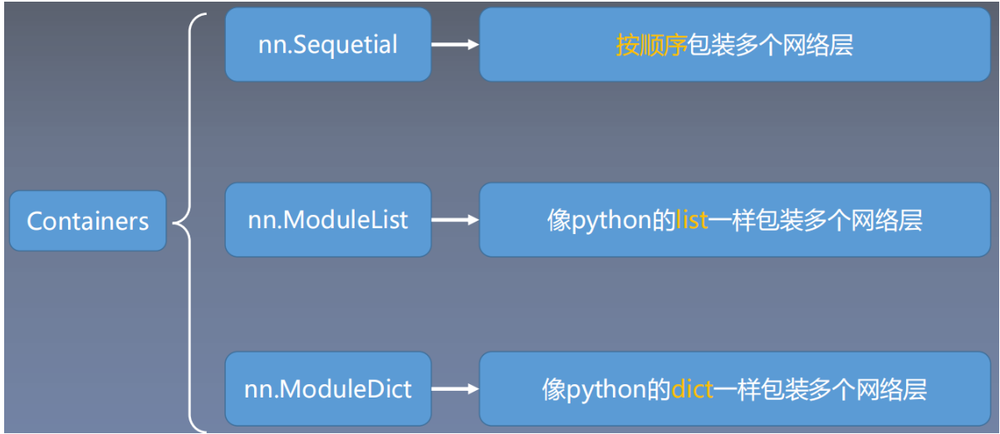

#### 2）容器之nn.Sequential  
nn.Sequential 是 nn.module的容器，用于按顺序包装一组网络层
- 顺序性：各网络层之间严格按照顺序构建
- 自带forward()：自带的forward里，通过for循环依次执行前向传播运算

使用方法：
- 直接包装网络层列表：每一层自动编号
- 使用add_module方法添加网络层：可以为每层指定编号
- 对sequential输入一个头有序的字典OrderedDict

In [37]:
class VGGNet(nn.Module):
    def __init__(self, num_classes):
        super(VGGNet, self).__init__()
        self.num_classes = num_classes
        self.feature = nn.Sequential()
        #使用add_module方法添加网络层
        self.feature.add_module("block1", VGGBlock([3, 64, 64], padding = 1, kernel_size = 3, stride = 1)) #类似于append方法
        self.feature.add_module("block2",VGGBlock([64,128,128],padding=1, kernel_size=3, stride=1))
        self.feature.add_module("block3",VGGBlock([128,256,256,256],padding=1, kernel_size=3, stride=1))
        self.feature.add_module("block4",VGGBlock([256,512,512,512],padding=1, kernel_size=3, stride=1))
        self.feature.add_module("block5",VGGBlock([512,512,512,512],padding=1, kernel_size=3, stride=1))
        
        #fc 直接包装网络层列表 
        self.fc = nn.Sequential(
            nn.Linear(in_features = 512 * 7 * 7, out_features = 4096),
            nn.ReLU(),
            nn.Dropout(p = 0.5)
        )

        #classifier
        self.classifier = nn.Sequential(OrderedDict({
            'fc1': nn.Linear(in_features = 4096, out_features = 4096),
            'relu1': nn.ReLU(),
            'drop1': nn.Dropout(p = 0.5),
            'fc2': nn.Linear(in_features = 4096, out_features = self.num_classes)
        }))

    def forward(self, x):
        x = self.feature(x)  #不用for循环 因为Sequential这个累内部实现了for循环
        x = x.view(x.size(0), -1)
        x = self.fc(x)
        x = self.classifier(x)
        return x
    
m = VGGNet(10)
input = torch.randn(8, 3, 224, 224)
output = m(input)
output.size(), m, m.parameters # 结果每个block内部网络的参数还是看不到，因为前面还是沿用前面那个使用python原生的方法实现的

(torch.Size([8, 10]),
 VGGNet(
   (feature): Sequential(
     (block1): VGGBlock()
     (block2): VGGBlock()
     (block3): VGGBlock()
     (block4): VGGBlock()
     (block5): VGGBlock()
   )
   (fc): Sequential(
     (0): Linear(in_features=25088, out_features=4096, bias=True)
     (1): ReLU()
     (2): Dropout(p=0.5, inplace=False)
   )
   (classifier): Sequential(
     (fc1): Linear(in_features=4096, out_features=4096, bias=True)
     (relu1): ReLU()
     (drop1): Dropout(p=0.5, inplace=False)
     (fc2): Linear(in_features=4096, out_features=10, bias=True)
   )
 ),
 <bound method Module.parameters of VGGNet(
   (feature): Sequential(
     (block1): VGGBlock()
     (block2): VGGBlock()
     (block3): VGGBlock()
     (block4): VGGBlock()
     (block5): VGGBlock()
   )
   (fc): Sequential(
     (0): Linear(in_features=25088, out_features=4096, bias=True)
     (1): ReLU()
     (2): Dropout(p=0.5, inplace=False)
   )
   (classifier): Sequential(
     (fc1): Linear(in_features=4096, out_

#### 3）容器之nn.ModuleList
nn.ModuleList是 nn.module的容器，用于包装一组网络层，以迭代方式调用网络层，自动将每个 module 的 parameters 添加到网络之中的容器（之前python 的List实现则不能）

主要方法：
- append()：在ModuleList后面添加网络层
- extend()：拼接两个ModuleList
- insert()：指定在ModuleList中位置插入网络层

**注意：nn.Sequential内部实现了forward函数，因此可以不用写forward函数。而nn.ModuleList则没有实现内部forward函数。**

In [38]:
class VGGNet(nn.Module):
    def __init__(self, num_classes):
        super(VGGNet, self).__init__()
        self.num_classes = num_classes
        self.feature = nn.ModuleList([
            VGGBlock([3,64,64],padding=1, kernel_size=3, stride=1),
            VGGBlock([64,128,128],padding=1, kernel_size=3, stride=1),
            VGGBlock([128,256,256,256],padding=1, kernel_size=3, stride=1),
            VGGBlock([256,512,512,512],padding=1, kernel_size=3, stride=1),
            VGGBlock([512,512,512,512],padding=1, kernel_size=3, stride=1)
        ])
        # classifier
        self.classifier=nn.Sequential(
            nn.Linear(in_features=512*7*7, out_features=4096),
            nn.ReLU(),
            nn.Dropout(p=0.5),
            nn.Linear(in_features=4096, out_features=4096),
            nn.ReLU(),
            nn.Dropout(p=0.5),
            nn.Linear(in_features=4096, out_features=self.num_classes)
        )

    def forward(self, x):
        for layer in self.feature: #ModuleList没有实现forward方法的，所以只能自己实现前向传播运算
            x = layer(x)
        
        x = x.view(x.size(0), -1)

        x=self.classifier(x)#Sequential自带forward方法
        return x
    
m = VGGNet(10)
input = torch.randn(8, 3, 224, 224)
output = m(input)
output.size(), m, m.parameters

(torch.Size([8, 10]),
 VGGNet(
   (feature): ModuleList(
     (0-4): 5 x VGGBlock()
   )
   (classifier): Sequential(
     (0): Linear(in_features=25088, out_features=4096, bias=True)
     (1): ReLU()
     (2): Dropout(p=0.5, inplace=False)
     (3): Linear(in_features=4096, out_features=4096, bias=True)
     (4): ReLU()
     (5): Dropout(p=0.5, inplace=False)
     (6): Linear(in_features=4096, out_features=10, bias=True)
   )
 ),
 <bound method Module.parameters of VGGNet(
   (feature): ModuleList(
     (0-4): 5 x VGGBlock()
   )
   (classifier): Sequential(
     (0): Linear(in_features=25088, out_features=4096, bias=True)
     (1): ReLU()
     (2): Dropout(p=0.5, inplace=False)
     (3): Linear(in_features=4096, out_features=4096, bias=True)
     (4): ReLU()
     (5): Dropout(p=0.5, inplace=False)
     (6): Linear(in_features=4096, out_features=10, bias=True)
   )
 )>)

#### 4）容器之nn.ModuleLDict  
nn.ModuleDict是 nn.module的容器，用于包装一组网络层，以索引方式调用网络层

主要方法：
- clear()：清空ModuleDict
- items()：返回可迭代的键值对(key-value pairs)
- keys()：返回字典的键(key)
- values()：返回字典的值(value)
- pop()：返回一对键值，并从字典中删除

In [39]:
class MyModel(nn.Module):
    def __init__(self):
        super(MyModel, self).__init__()
        self.choices = nn.ModuleDict({
            'conv': nn.Conv2d(10, 10, 3),
            'pool': nn.MaxPool2d(3)
        })

        self.activations = nn.ModuleDict({
            'relu': nn.ReLU(),
            'prelu': nn.PReLU()
        })

    def forward(self, x, choices, act):
        # x = self.choices[choice](x) # 不一定意味着只能用一个
        for choi in choices:
            x = self.choices[choi](x)
        x = self.activations[act](x)
        return x
    
net = MyModel()
fake_img = torch.randn((4, 10, 32, 32))
output = net(fake_img, ['conv', 'pool'], 'relu')
output.size()

torch.Size([4, 10, 10, 10])